# Check Lightcone

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import os
# We change the default level of the logger so that
# we can see what's happening with caching.
import logging, sys
logger = logging.getLogger('21cmFAST')
logger.setLevel(logging.INFO)

import time

import py21cmfast as p21c
# For plotting the cubes, we use the plotting submodule:
from py21cmfast import plotting
# For interacting with the cache
from py21cmfast import cache_tools

/home/cxshan/.conda/envs/21cmsim37/lib/python3.7/site-packages/py21cmfast/_cfg.py:50: UserWarning: Your configuration file is out of date. Updating...
  "Your configuration file is out of date. Updating..."
/home/cxshan/.conda/envs/21cmsim37/lib/python3.7/site-packages/py21cmfast/_cfg.py:33: UserWarning: Your configuration file is out of date. Updating...
  warnings.warn("Your configuration file is out of date. Updating...")


In [2]:
import pickle

# Loading the lightcone from disk

In [3]:
L1200M294 = p21c.outputs.LightCone.read(fname='Lightcone1200M294',direc='/home/cxshan/split')

In [4]:
L1200M294

In [5]:
p21c.plotting.lightcone_sliceplot?

Signature:
p21c.plotting.lightcone_sliceplot(
    lightcone: 'LightCone',
    kind: 'str' = 'brightness_temp',
    lightcone2: 'LightCone' = None,
    vertical: 'bool' = False,
    xlabel: 'str | None' = None,
    ylabel: 'str | None' = None,
    cbar_label: 'str | None' = None,
    zticks: 'str' = 'redshift',
    fig: 'plt.Figure | None' = None,
    ax: 'plt.Axes | None' = None,
    **kwargs,
)
Docstring:
Create a 2D plot of a slice through a lightcone.

Parameters
----------
lightcone : :class:`~py21cmfast.wrapper.Lightcone`
    The lightcone object to plot
kind : str, optional
    The attribute of the lightcone to plot. Must be an array.
lightcone2 : str, optional
    If provided, plot the _difference_ of the selected attribute between the two
    lightcones.
vertical : bool, optional
    Whether to plot the redshift in the vertical direction.
cbar_label : str, optional
    A label for the colorbar. Some quantities have automatically chosen labels, but
    these can be removed by se

(<Figure size 14795.3x1476 with 2 Axes>,
 <AxesSubplot:xlabel='Redshift', ylabel='y-axis [Mpc]'>)

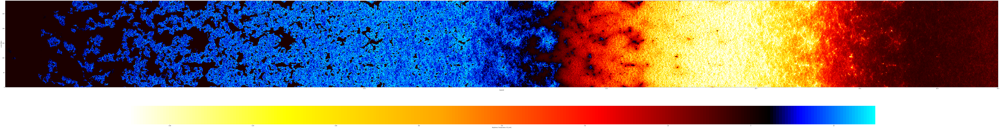

In [6]:
p21c.plotting.lightcone_sliceplot(L1200M294)

(<Figure size 504x288 with 1 Axes>,
 <AxesSubplot:xlabel='Redshift', ylabel='brightness_temp'>)

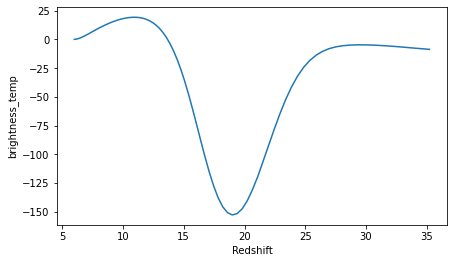

In [7]:
p21c.plotting.plot_global_history(L1200M294)

(<Figure size 504x288 with 1 Axes>,
 <AxesSubplot:xlabel='Redshift', ylabel='xH'>)

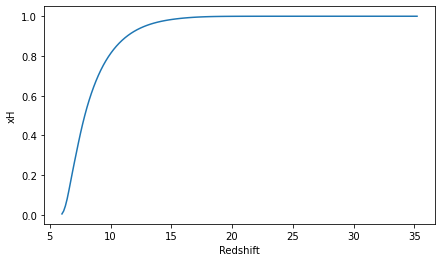

In [8]:
p21c.plotting.plot_global_history(L1200M294, kind="xH")

# Lightcone info

In [9]:
L1200M294.cell_size

0.245

In [10]:
L1200M294.lightcone_dimensions

(294, 294, 3348.17)

In [11]:
L1200M294.lightcone_distances

array([ 8425.27161212,  8425.51663005,  8425.76164798, ...,
       11772.95157626, 11773.19659419, 11773.44161212])

In [12]:
L1200M294.lightcone_redshifts

array([ 6.00000001,  6.0005736 ,  6.00114718, ..., 34.99886449,
       35.00555833, 35.01225377])

In [13]:
L1200M294.lightcone_coords

array([0.00000000e+00, 2.45017929e-01, 4.90035858e-01, ...,
       3.34767996e+03, 3.34792498e+03, 3.34817000e+03])

In [14]:
L1200M294.n_slices

13666

In [15]:
L1200M294.shape

(1200, 1200, 13666)

In [16]:
L1200M294.global_xHI

/home/cxshan/.conda/envs/21cmsim37/lib/python3.7/site-packages/py21cmfast/outputs.py:1147: UserWarning: global_xHI is deprecated. From now on, use global_xH. Will be removed in v3.1
  "global_xHI is deprecated. From now on, use global_xH. Will be removed in v3.1"


array([0.99999547, 0.99999547, 0.99999547, 0.99999547, 0.99999547,
       0.99999547, 0.99999547, 0.99999547, 0.99999547, 0.99999547,
       0.99999547, 0.99999547, 0.99999547, 0.99999547, 0.99999422,
       0.99999326, 0.99999183, 0.99998999, 0.99998683, 0.99998164,
       0.99997413, 0.99996346, 0.99994731, 0.99992472, 0.99988985,
       0.99983984, 0.99977046, 0.99967051, 0.99952978, 0.99933016,
       0.99905157, 0.99868447, 0.99817502, 0.99750775, 0.9966628 ,
       0.99560869, 0.9943372 , 0.99281913, 0.99106896, 0.98904645,
       0.98674148, 0.98414713, 0.98123747, 0.97795409, 0.97423518,
       0.97006208, 0.9653542 , 0.96009231, 0.95420736, 0.9476794 ,
       0.9404406 , 0.93244296, 0.92362154, 0.91390228, 0.90320933,
       0.89150888, 0.87870461, 0.86478645, 0.84966081, 0.83324438,
       0.81547111, 0.79624772, 0.77543771, 0.75296539, 0.72866458,
       0.7024048 , 0.67419565, 0.64399838, 0.61170369, 0.57716686,
       0.54018211, 0.50029981, 0.4579114 , 0.41299525, 0.36576

In [17]:
def lightconeinfo( lightcone ):
    r"""
    *** Save the lightcone info in a dict ***
    :Params lightcone: the input lightcone;
    :Output info: the info dict contains all the Lightcone attribute;
    """
    info = {}
    info['cell_size'] = lightcone.cell_size
    info['global_xHI'] = lightcone.global_xHI
    info['lightcone_coords'] = lightcone.lightcone_coords
    info['lightcone_dimensions'] = lightcone.lightcone_dimensions
    info['lightcone_distances'] = lightcone.lightcone_distances
    info['n_slices'] = lightcone.n_slices
    info['lightcone_redshifts'] = lightcone.lightcone_redshifts
    info['shape'] = lightcone.shape
    return info

def pklsave( data, file ):
    r"""
    *** Save intermediate files w/ pkl ***
    Params data: data to be stored;
    Params file: file name to be stored;
    """
    #Save skymodel
    pickle_file = open(file, 'wb')
    pickle.dump(data, pickle_file,  protocol=4)
    pickle_file.close()
    print(file, "is saved!")

In [18]:
info = lightconeinfo(L1200M294)

In [19]:
pklsave(info, "L1200M294")

L1200M294 is saved!
